<a href="https://colab.research.google.com/github/sangam11a/300Days__MachineLearningDeepLearning/blob/main/GNN_for_mnist_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.3 MB/s eta 0:00:00


In [2]:
!pip install dgl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
  

In [3]:
!pip install torchdata
!pip uninstall dgl torchdata -y
!pip install dgl torchdata

Found existing installation: dgl 2.1.0
Uninstalling dgl-2.1.0:
  Successfully uninstalled dgl-2.1.0
Found existing installation: torchdata 0.10.1
Uninstalling torchdata-0.10.1:
  Successfully uninstalled torchdata-0.10.1
  Using cached dgl-2.1.0-cp311-cp311-manylinux1_x86_64.whl.metadata (553 bytes)
  Using cached torchdata-0.10.1-py3-none-any.whl.metadata (6.3 kB)
Using cached dgl-2.1.0-cp311-cp311-manylinux1_x86_64.whl (8.6 MB)
Using cached torchdata-0.10.1-py3-none-any.whl (57 kB)


In [4]:
import torch
from torch.utils.data import DataLoader
from torch_geometric.data import Data
from torch_geometric.datasets.mnist_superpixels import MNISTSuperpixels


def build_mnist_superpixels_dataset(train: bool) -> MNISTSuperpixels:
    return MNISTSuperpixels(
        root="mnist-superpixels-dataset",
        train=train,
    )


def build_collate_fn(device: str | torch.device):
    def collate_fn(original_batch: list[Data]):
        batch_node_features: list[torch.Tensor] = []
        batch_edge_indices: list[torch.Tensor] = []
        classes: list[int] = []

        for data in original_batch:
            node_features = torch.cat((data.x, data.pos), dim=-1).to(device)
            edge_indices = data.edge_index.to(device)
            class_ = int(data.y)

            batch_node_features.append(node_features)
            batch_edge_indices.append(edge_indices)
            classes.append(class_)

        collated = {
            "batch_node_features": batch_node_features,
            "batch_edge_indices": batch_edge_indices,
            "classes": torch.LongTensor(classes).to(device),
        }

        return collated

    return collate_fn


def build_dataloader(
    dataset: MNISTSuperpixels,
    batch_size: int,
    shuffle: bool,
    device: str | torch.device,
) -> DataLoader:
    loader = DataLoader(
        dataset=dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        collate_fn=build_collate_fn(device=device),
    )

    return loader


def build_train_val_dataloaders(batch_size: int, device: str) -> tuple[DataLoader, DataLoader]:
    train_dataset = build_mnist_superpixels_dataset(train=True)
    val_dataset = build_mnist_superpixels_dataset(train=False)

    train_loader = build_dataloader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True,
        device=device,
    )

    val_loader = build_dataloader(
        dataset=val_dataset,
        batch_size=batch_size,
        shuffle=False,
        device=device,
    )

    return train_loader, val_loader

In [5]:
import torch
from torch import nn
from torch_geometric.nn import GATConv


class GNNImageClassificator(nn.Module):
    """
    See Figure 2 from https://iopscience.iop.org/article/10.1088/1742-6596/1871/1/012071/pdf
    """
    def __init__(
        self,
        in_channels: int = 3,
        hidden_dim: int = 152,
        num_classes: int = 10,
    ):
        super().__init__()

        self.in_channels = in_channels
        self.hidden_dim = hidden_dim
        self.num_classes = num_classes

        self.conv1 = GATConv(in_channels=in_channels, out_channels=hidden_dim)
        self.conv2 = GATConv(in_channels=hidden_dim, out_channels=hidden_dim)
        self.conv3 = GATConv(in_channels=in_channels + hidden_dim, out_channels=hidden_dim)

        self.fc = nn.Sequential(
            nn.Linear(in_channels + 3 * hidden_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, 32),
            nn.ReLU(True),
            nn.Linear(32, 32),
            nn.ReLU(True),
            nn.Linear(32, num_classes),
        )

    def forward_one_base(self, node_features: torch.Tensor, edge_indices: torch.Tensor) -> torch.Tensor:
        assert node_features.ndim == 2 and node_features.shape[1] == self.in_channels
        assert edge_indices.ndim == 2 and edge_indices.shape[0] == 2

        x0 = node_features

        x1 = self.conv1(x0, edge_indices)

        x2 = self.conv2(x1, edge_indices)
        x0_x2 = torch.cat((x0, x2), dim=-1)

        x3 = self.conv3(x0_x2, edge_indices)
        x0_x1_x2_x3 = torch.cat((x0, x1, x2, x3), dim=-1)

        return x0_x1_x2_x3

    def forward(self, batch_node_features: list[torch.Tensor], batch_edge_indices: list[torch.Tensor]) -> torch.Tensor:
        assert len(batch_node_features) == len(batch_edge_indices)

        features_list = []
        for node_features, edge_indices in zip(batch_node_features, batch_edge_indices):
            features_list.append(self.forward_one_base(node_features=node_features, edge_indices=edge_indices))

        features = torch.stack(features_list, dim=0)  # BATCH_SIZE x NUM_NODES x NUM_FEATURES
        features = features.mean(dim=1)  # readout operation [BATCH_SIZE x NUM_FEATURES]

        logits = self.fc(features)
        return logits

Extracting mnist-superpixels-dataset/raw/MNISTSuperpixels.zip
Processing...
Done!


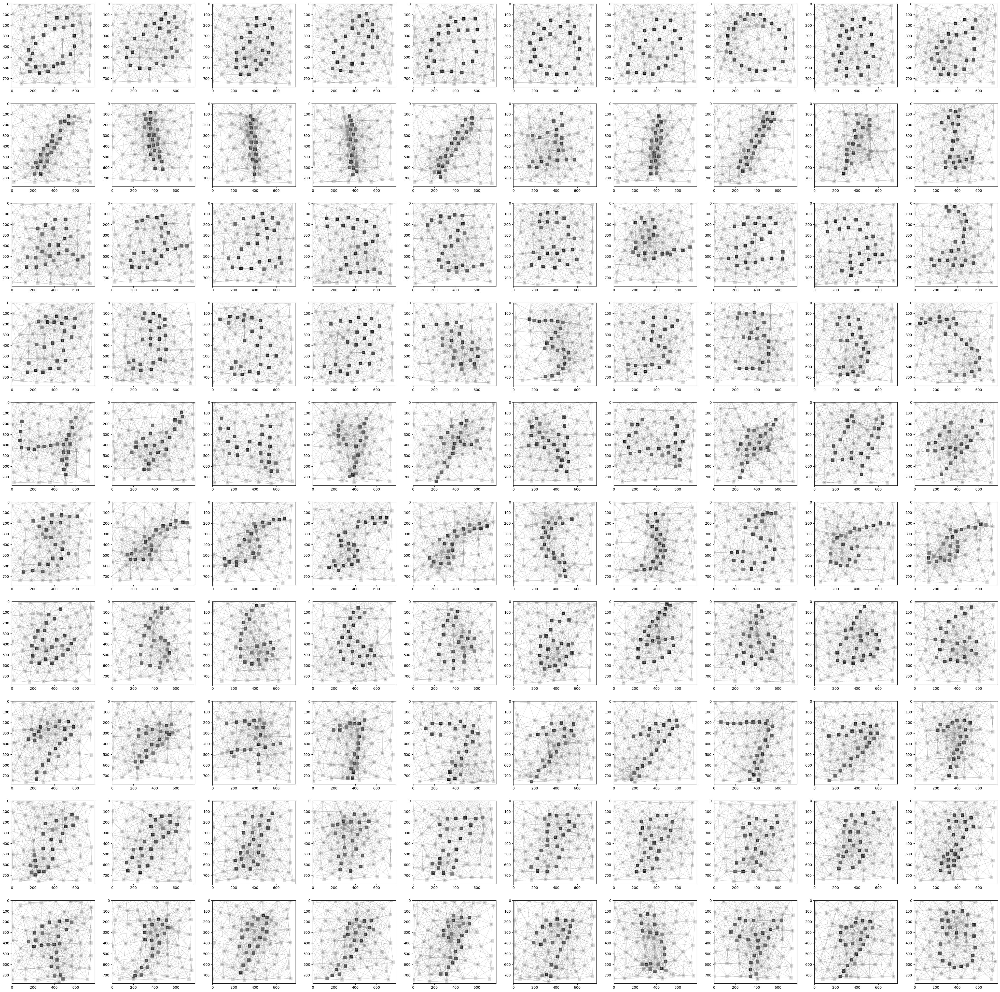

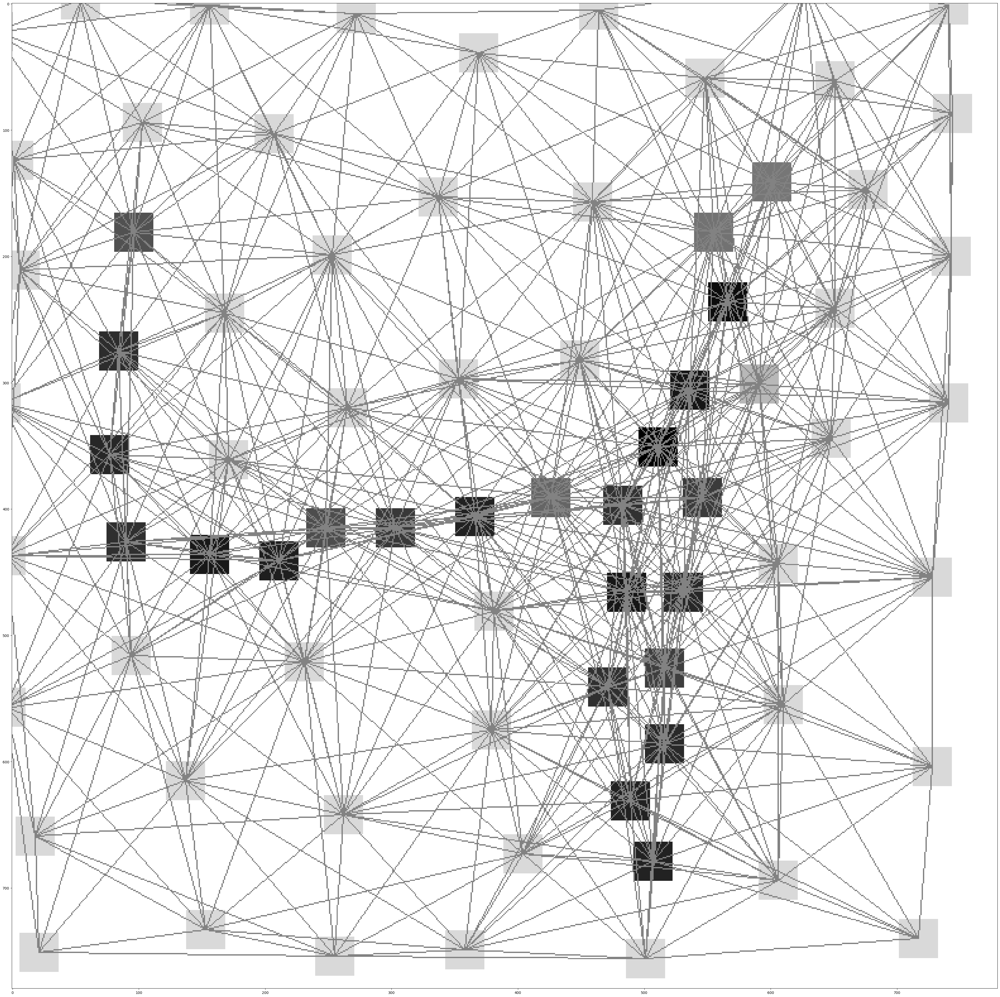

In [6]:
import cv2
import numpy as np
import torch_geometric
from matplotlib import pyplot as plt
from torch_geometric.datasets import MNISTSuperpixels

# from gnn_image_classification.datasets import build_mnist_superpixels_dataset


def superpixels_to_2d_image(rec: torch_geometric.data.Data, scale: int = 30, edge_width: int = 1) -> np.ndarray:
    pos = (rec.pos.clone() * scale).int()

    image = np.zeros((scale * 26, scale * 26, 1), dtype=np.uint8)
    for (color, (x, y)) in zip(rec.x, pos):
        x0, y0 = int(x), int(y)
        x1, y1 = x0 - scale, y0 - scale

        color = int(float(color + 0.15) * 255)
        color = min(color, 255)

        cv2.rectangle(image, (x0, y0), (x1, y1), color, -1)

    for node_ix_0, node_ix_1 in rec.edge_index.T:
        x0, y0 = list(map(int, pos[node_ix_0]))
        x1, y1 = list(map(int, pos[node_ix_1]))

        x0 -= scale // 2
        y0 -= scale // 2
        x1 -= scale // 2
        y1 -= scale // 2

        cv2.line(image, (x0, y0), (x1, y1), 125, edge_width)
    return image


def visualize(
    dataset: MNISTSuperpixels,
    image_name: str,
    examples_per_class: int = 10,
    classes: tuple[int, ...] = tuple(range(10)),
    figsize: tuple[int, int] = (50, 50),
    edge_width: int = 1,
) -> None:
    class_to_examples = {class_ix: [] for class_ix in classes}

    for record in dataset:
        enough = True
        for examples in class_to_examples.values():
            if len(examples) < examples_per_class:
                enough = False
        if enough:
            break

        class_ix = int(record.y)

        if class_ix not in class_to_examples:
            continue

        if len(class_to_examples[class_ix]) == examples_per_class:
            continue

        if len(class_to_examples[class_ix]) > examples_per_class:
            raise RuntimeError

        class_to_examples[class_ix].append(superpixels_to_2d_image(record, edge_width=edge_width))

    plt.figure(figsize=figsize)
    subplot_ix = 1
    for class_ix in classes:
        for example in class_to_examples[class_ix]:
            plt.subplot(len(classes), examples_per_class, subplot_ix)
            subplot_ix += 1
            plt.imshow(example, cmap=plt.cm.binary)
    plt.savefig(image_name)


if __name__ == "__main__":
    train_dataset = build_mnist_superpixels_dataset(train=True)
    test_dataset = build_mnist_superpixels_dataset(train=False)

    visualize(
        train_dataset,
        image_name="all_classes.jpg",
    )

    visualize(
        train_dataset,
        image_name="one_class.jpg",
        classes=(4,),
        examples_per_class=1,
    )

In [7]:
net = GNNImageClassificator()
print(net)
print(train_dataset[0])

GNNImageClassificator(
  (conv1): GATConv(3, 152, heads=1)
  (conv2): GATConv(152, 152, heads=1)
  (conv3): GATConv(155, 152, heads=1)
  (fc): Sequential(
    (0): Linear(in_features=459, out_features=256, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=256, out_features=32, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=32, out_features=32, bias=True)
    (5): ReLU(inplace=True)
    (6): Linear(in_features=32, out_features=10, bias=True)
  )
)
Data(x=[75, 1], edge_index=[2, 1399], y=[1], pos=[75, 2])


In [8]:
# from typing import Callable, cast

# import click
# import torch
# import wandb
# from torch.utils.data import DataLoader
# from torch_geometric.datasets import MNISTSuperpixels

# # from gnn_image_classification.datasets import build_train_val_dataloaders
# # from gnn_image_classification.model import GNNImageClassificator
# # from gnn_image_classification.visualize_graphs import visualize


# def train_one_epoch(
#     model: GNNImageClassificator,
#     optimizer: torch.optim.Optimizer,
#     train_loader: DataLoader,
#     criterion: Callable,
#     batches_passed: int,
# ) -> int:
#     model.train()
#     count =0;
#     for batch in train_loader:
#         count+=1
#         print(f"Count: {count}")
#         batch_node_features = batch["batch_node_features"]
#         batch_edge_indices = batch["batch_edge_indices"]
#         classes = batch["classes"]

#         logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
#         predicted_classes = torch.argmax(logits, dim=1)

#         loss = criterion(logits, classes).mean()

#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         accuracy = (predicted_classes == classes).to(torch.float32).mean()

#         wandb.log({
#             "train_accuracy": float(accuracy.detach().cpu().numpy()),
#             "train_loss": float(loss.detach().cpu().numpy()),
#             "batch": batches_passed,
#         })

#         batches_passed += 1

#     return batches_passed


# @torch.no_grad()
# def evaluate(
#     model: GNNImageClassificator,
#     val_loader: DataLoader,
#     epochs_passed: int,
# ) -> None:
#     model.eval()

#     accuracy_sum: float = 0.0
#     num_samples: int = 0

#     for batch in val_loader:
#         batch_node_features = batch["batch_node_features"]
#         batch_edge_indices = batch["batch_edge_indices"]
#         classes = batch["classes"]

#         logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
#         predicted_classes = torch.argmax(logits, dim=1)

#         accuracy_sum += float((predicted_classes == classes).to(torch.float32).mean().cpu().numpy()) * len(classes)
#         num_samples += len(classes)

#     accuracy = accuracy_sum / num_samples

#     wandb.log({
#         "val_accuracy": accuracy,
#         "epoch": epochs_passed,
#     })


# # @click.command()
# # @click.option("--batch-size", type=int, default=64)
# # @click.option("--epochs", type=int, default=100)
# # @click.option("--device", type=str, default="cpu")
# # @click.option("--hidden-dim", type=int, default=152)
# # @click.option("--lr", type=float, default=1e-3)
# def train(
#     batch_size: int,
#     epochs: int,
#     device: str,
#     hidden_dim: int,
#     lr: float,
# ) -> None:
#     wandb.init(project="cifar-10-gnn-classification")
#     wandb.config.batch_size = batch_size
#     wandb.config.epochs = epochs
#     wandb.config.device = device
#     wandb.config.hidden_dim = hidden_dim
#     wandb.config.lr = lr

#     wandb.define_metric("batch")
#     wandb.define_metric("epoch")
#     wandb.define_metric("train_accuracy", step_metric="batch")
#     wandb.define_metric("train_loss", step_metric="batch")
#     wandb.define_metric("val_accuracy", step_metric="epoch")

#     model = GNNImageClassificator(in_channels=3, hidden_dim=hidden_dim).to(device)
#     train_loader, val_loader = build_train_val_dataloaders(batch_size=batch_size, device=device)
#     optimizer = torch.optim.Adam(lr=lr, params=model.parameters())

#     # SAVE VISUALIZATION
#     visualize(
#         cast(MNISTSuperpixels, train_loader.dataset),
#         image_name="all_classes.jpg",
#     )

#     visualize(
#         cast(MNISTSuperpixels, train_loader.dataset),
#         image_name="one_class.jpg",
#         classes=(4,),
#         examples_per_class=1,
#     )

#     wandb.log({
#         "sample_images": [
#             wandb.Image("all_classes.jpg"),
#             wandb.Image("one_class.jpg"),
#         ]
#     })
#     # SAVE VISUALIZATION END

#     batches_passed = 0

#     for epoch_ix in range(epochs):
#         batches_passed = train_one_epoch(
#             model=model,
#             optimizer=optimizer,
#             train_loader=train_loader,
#             criterion=torch.nn.CrossEntropyLoss(),
#             batches_passed=batches_passed,
#         )

#         evaluate(
#             model=model,
#             val_loader=val_loader,
#             epochs_passed=epoch_ix + 1,
#         )


# if __name__ == "__main__":
#     device = "cuda" if torch.cuda.is_available() else "cpu"
#     train(device = device, batch_size = 64, epochs = 100, hidden_dim = 152, lr = 0.001)
#     # @click.command()
# # @click.option("--batch-size", type=int, default=64)
# # @click.option("--epochs", type=int, default=100)
# # @click.option("--device", type=str, default="cpu")
# # @click.option("--hidden-dim", type=int, default=152)
# # @click.option("--lr", type=float, default=1e-3)

In [ ]:
from typing import Callable
import torch
from torch.utils.data import DataLoader
from torch_geometric.datasets import MNISTSuperpixels
from tqdm import tqdm

# from gnn_image_classification.datasets import build_train_val_dataloaders
# from gnn_image_classification.model import GNNImageClassificator
# from gnn_image_classification.visualize_graphs import visualize

def train_one_epoch(
    model: GNNImageClassificator,
    optimizer: torch.optim.Optimizer,
    train_loader: DataLoader,
    criterion: Callable,
    batches_passed: int,
) -> int:
    model.train()
    total_loss = 0
    correct = 0
    total_samples = 0

    for batch in tqdm(train_loader, desc="Training", leave=False):
        batch_node_features = batch["batch_node_features"]
        batch_edge_indices = batch["batch_edge_indices"]
        classes = batch["classes"]

        logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
        predicted_classes = torch.argmax(logits, dim=1)

        loss = criterion(logits, classes).mean()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        correct += (predicted_classes == classes).sum().item()
        total_samples += len(classes)

        batches_passed += 1

    avg_loss = total_loss / len(train_loader)
    accuracy = correct / total_samples
    print(f"Train Loss: {avg_loss:.4f}, Train Accuracy: {accuracy:.4f}")
    return batches_passed

@torch.no_grad()
def evaluate(
    model: GNNImageClassificator,
    val_loader: DataLoader,
    epochs_passed: int,
) -> None:
    model.eval()
    correct = 0
    total_samples = 0

    for batch in tqdm(val_loader, desc="Evaluating", leave=False):
        batch_node_features = batch["batch_node_features"]
        batch_edge_indices = batch["batch_edge_indices"]
        classes = batch["classes"]

        logits = model(batch_node_features=batch_node_features, batch_edge_indices=batch_edge_indices)
        predicted_classes = torch.argmax(logits, dim=1)

        correct += (predicted_classes == classes).sum().item()
        total_samples += len(classes)

    accuracy = correct / total_samples
    print(f"Epoch {epochs_passed}: Validation Accuracy: {accuracy:.4f}")

def train(
    batch_size: int = 64,
    epochs: int = 100,
    device: str = "cpu",
    hidden_dim: int = 152,
    lr: float = 1e-3,
) -> None:
    print("Initializing training...")
    model = GNNImageClassificator(in_channels=3, hidden_dim=hidden_dim).to(device)
    train_loader, val_loader = build_train_val_dataloaders(batch_size=batch_size, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    batches_passed = 0
    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")
        batches_passed = train_one_epoch(model, optimizer, train_loader, torch.nn.CrossEntropyLoss(), batches_passed)
        evaluate(model, val_loader, epoch + 1)

if __name__ == "__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    train(device=device, batch_size=64, epochs=100, hidden_dim=152, lr=0.001)


Initializing training...
Epoch 1/100


Train Loss: 2.3025, Train Accuracy: 0.1098


Epoch 1: Validation Accuracy: 0.1135
Epoch 2/100


Train Loss: 2.2211, Train Accuracy: 0.1558


Epoch 2: Validation Accuracy: 0.3280
Epoch 3/100


Training:  58%|█████▊    | 544/938 [06:56<05:38,  1.16it/s]